# Coursework 2: Generative Models

## Instructions

Please submit on CATe two zip files:

*CW2.zip* containing the following:
1. A version of this notebook containing your answers. Write your answers in the cells below each question. **Please deliver the notebook including the outputs of the cells below.**
2. Your trained VAE model as *VAE_model.pth*

*GAN.zip* containing your trained Generator and Discriminator: *DCGAN_model_D.pth and DCGAN_model_G.pth*

Please avoid using markdown headings (# ## etc.) as these will affect the ToC. Instead use html headings if you want emphasis.

Similarly to the previous coursework, we recommend that you use Google Colaboratory in order to train the required networks.

TAs will run a testing cell (at the end of this notebook), so you are required to copy your transform and denorm functions to a cell near the bottom of the document (it is demarkated).

<font color="blue">**The deadline for submission is 19:00, Thursday 19th February, 2021** </font>

## Setting up working environment

For this coursework you, will need to train a large network, therefore we recommend you work with Google Colaboratory, which provides free GPU time. You will need a Google account to do so.

Please log in to your account and go to the following page: https://colab.research.google.com. Then upload this notebook.

For GPU support, go to "Edit" -> "Notebook Settings", and select "Hardware accelerator" as "GPU".

You will need to install pytorch and import some utilities by running the following cell:

In [ ]:
!pip install -q torch torchvision
!git clone -q https://github.com/afspies/icl_dl_cw2_utils
from icl_dl_cw2_utils.utils.plotting import plot_tsne
%load_ext google.colab.data_table

In [ ]:
from google.colab import drive
drive.mount('/content/drive') # Outputs will be saved in your google drive

## Introduction

For this coursework, you are asked to implement two commonly used generative models:
1. A **Variational Autoencoder (VAE)**
2. A **Deep Convolutional Generative Adversarial Network (DCGAN)**

For the first part you will the MNIST dataset https://en.wikipedia.org/wiki/MNIST_database and for the second the CIFAR-10 (https://www.cs.toronto.edu/~kriz/cifar.html).

Each part is worth 50 points. 

The emphasis of both parts lies in understanding how the models behave and learn, however, some points will be available for getting good results with your GAN (though you should not spend too long on this).

# Part 1 - Variational Autoencoder

## Part 1.1 (25 points)
**Your Task:**

a. Implement the VAE architecture with accompanying hyperparameters. Experiment with Feedforward and Convolutional Layers to see which gives better results.

b. Design an appropriate loss function and train the model.


In [35]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/'):
    os.makedirs('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/')

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

Using cuda


---
## Part 1.1a: Implement VAE (25 Points)
###Hyper-parameter selection


In [36]:
# Necessary Hyperparameters 
num_epochs = 16
learning_rate = 0.0004
batch_size = 128
latent_dim = 20 # Choose a value for the size of the latent space

# Additional Hyperparameters 
beta = 3

# (Optionally) Modify transformations on input
transform = transforms.Compose([
    transforms.ToTensor(),
    lambda x: x.round() # For Bernoulli assumption
])

# (Optionally) Modify the network's output for visualizing your images
def denorm(x):
    return x

### Data loading


In [37]:
train_dat = datasets.MNIST("data/", train=True, download=True, transform=transform)
test_dat = datasets.MNIST("data/", train=False, transform=transform)

loader_train = DataLoader(train_dat, batch_size, shuffle=True)
loader_test = DataLoader(test_dat, batch_size, shuffle=False)

# Don't change 
sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[:32, :, :, :]
save_image(fixed_input, '/content/drive/MyDrive/icl_dl_cw2/CW_VAE/image_original.png')

### Model Definition

<figure>
  <img src="https://blog.bayeslabs.co/assets/img/vae-gaussian.png" style="width:60%">
  <figcaption>
    Fig.1 - VAE Diagram (with a Guassian prior), taken from <a href="https://blog.bayeslabs.co/2019/06/04/All-you-need-to-know-about-Vae.html">1</a>.
  </figcaption>
</figure>


You will need to define:
* The hyperparameters
* The constructor
* encode
* reparametrize
* decode
* forward



Hints:
- It is common practice to encode the log of the variance, rather than the variance
- You might try using BatchNorm

In [38]:
# *CODE FOR PART 1.1a IN THIS CELL*

# Made as classes for Sequential
class Reshape1(nn.Module):
    def forward(self, x):
        N = x.shape[0]
        return x.view(N, -1)

class Reshape2(nn.Module):
    def __init__(self, shape):
        super(Reshape2, self).__init__()
        self.shape = shape

    def forward(self, x):
        return x.view(*self.shape)

class VAE(nn.Module):
    def __init__(self, latent_dim):
        super(VAE, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################

        # Convolutional Encoder
        self.encoder = nn.Sequential(
            nn.BatchNorm2d(1),
            nn.Conv2d(in_channels = 1, out_channels = 16, kernel_size = 3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels = 16, out_channels = 32, kernel_size = 3, stride=2, padding=1),
            nn.ReLU(),        
            nn.Conv2d(in_channels = 32, out_channels = 64, kernel_size = 3, stride = 1, padding = 0),
            Reshape1(),
            nn.Linear(1600, 120),
            nn.ReLU(),
            nn.Linear(120, 60),
            nn.ReLU(),
            nn.Linear(60, latent_dim*2))

        # Convolutional Decoder 
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 60),
            nn.ReLU(),
            nn.Linear(60, 120),
            nn.ReLU(),
            nn.Linear(120, 1600),
            Reshape2((-1, 64, 5, 5)),
            nn.ConvTranspose2d(in_channels = 64, out_channels = 32, stride = 1, kernel_size = 3),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels = 32,out_channels = 16,kernel_size = 3, stride = 2, padding = 1, output_padding = 1),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels = 16, out_channels = 1, kernel_size = 3, stride = 2, padding = 1, output_padding = 1),
            nn.Sigmoid()
        )
      
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
    def encode(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################

        # Split output of encoder in mean and logvar
        mean, logvar = torch.chunk(self.encoder(x), chunks = 2, dim = 1)

        return mean, logvar

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    
    def reparametrize(self, mu, logvar):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################

        std = torch.exp(0.5*logvar) if self.training else 0
        eps = torch.randn_like(std) if self.training else 0
        
        return mu + eps*std

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

    def decode(self, z):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################

        return self.decoder(z)

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    
    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################

        mu, logvar = self.encode(x)
        z = self.reparametrize(mu, logvar)
        recon = self.decode(z)

        return recon, mu, logvar

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

model = VAE(latent_dim).to(device)
params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Total number of parameters is: {}".format(params))
print(model)
# optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

Total number of parameters is: 450531
VAE(
  (encoder): Sequential(
    (0): BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (1): Conv2d(1, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (2): ReLU()
    (3): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): ReLU()
    (5): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1))
    (6): Reshape1()
    (7): Linear(in_features=1600, out_features=120, bias=True)
    (8): ReLU()
    (9): Linear(in_features=120, out_features=60, bias=True)
    (10): ReLU()
    (11): Linear(in_features=60, out_features=40, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=20, out_features=60, bias=True)
    (1): ReLU()
    (2): Linear(in_features=60, out_features=120, bias=True)
    (3): ReLU()
    (4): Linear(in_features=120, out_features=1600, bias=True)
    (5): Reshape2()
    (6): ConvTranspose2d(64, 32, kernel_size=(3, 3), stride=(1, 1))
    (7): ReLU()
    (8): ConvTran

--- 

## Part 1.1b: Training the Model (5 Points)

### Defining a Loss
Recall the Beta VAE loss, with an encoder $q$ and decoder $p$:
$$ \mathcal{L}=\mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]-\beta D_{K L}[q_\phi(z \mid X) \| p_\theta(z)]$$

In order to implement this loss you will need to think carefully about your model's outputs and the choice of prior.

There are multiple accepted solutions. Explain your design choices based on the assumptions you make regarding the distribution of your data.

* Hint: this refers to the log likelihood as mentioned in the tutorial. Make sure these assumptions reflect on the values of your input data, i.e. depending on your choice you might need to do a simple preprocessing step.

* You are encouraged to experiment with the weighting coefficient $\beta$ and observe how it affects your training

In [39]:
# *CODE FOR PART 1.1b IN THIS CELL*

def loss_function_VAE(recon_x, x, mu, logvar, beta):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################

        # Binary cross-entropy loss, assuming Bernoulli trials
        recon_loss = F.binary_cross_entropy(recon_x, x, reduction='sum')
        # KL Divergence
        KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

        return recon_loss + beta*KLD, recon_loss, beta*KLD
     
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

train_losses = []
test_losses = []

model.train()
for epoch in range(num_epochs):     
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################

        train_loss = 0
        train_RL = 0
        train_KLD = 0

        test_loss = 0
        test_RL = 0
        test_KLD = 0

        for batch_idx, (data, _) in enumerate(loader_train):
          data = data.to(device)
          optimizer.zero_grad()
          recon_x, mu, logvar = model(data)
          loss, recon_loss, KLD = loss_function_VAE(recon_x, data, mu, logvar, beta)
          train_loss += loss.item()
          train_RL += recon_loss.item()
          train_KLD += KLD.item()

          loss.backward()
          optimizer.step()

          if batch_idx % 250 == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(loader_train.dataset),
                100. * batch_idx / len(loader_train),
                loss.data / len(data)))

        print('Epoch: {} Average loss: {:.4f}'.format(epoch, train_loss / len(loader_train.dataset)))
        print()
        print("="*50)
        print()
        
        train_losses.append((train_loss, train_RL, train_KLD))

        with torch.no_grad():
          for (test_data, _) in loader_test:
            test_data = test_data.to(device)
            recon_x, mu, logvar = model(data)
            loss, recon_loss, KLD = loss_function_VAE(recon_x, data, mu, logvar, beta)
            test_loss += loss.item()
            test_RL += recon_loss.item()
            test_KLD += KLD.item()
        
        test_losses.append((test_loss, test_RL, test_KLD))

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
        # save the model
        if epoch == num_epochs - 1:
            with torch.no_grad():
                torch.jit.save(torch.jit.trace(model, (data), check_trace=False),
                    '/content/drive/MyDrive/icl_dl_cw2/CW_VAE/VAE_model.pth')


Train Epoch: 0 [0/60000 (0%)]	Loss: 530.389954
Train Epoch: 0 [32000/60000 (53%)]	Loss: 199.833832
Epoch: 0 Average loss: 229.2868


Train Epoch: 1 [0/60000 (0%)]	Loss: 196.799774
Train Epoch: 1 [32000/60000 (53%)]	Loss: 182.375259
Epoch: 1 Average loss: 185.3685


Train Epoch: 2 [0/60000 (0%)]	Loss: 170.534058
Train Epoch: 2 [32000/60000 (53%)]	Loss: 165.609695
Epoch: 2 Average loss: 165.0928


Train Epoch: 3 [0/60000 (0%)]	Loss: 153.422852
Train Epoch: 3 [32000/60000 (53%)]	Loss: 150.387634
Epoch: 3 Average loss: 152.9921


Train Epoch: 4 [0/60000 (0%)]	Loss: 150.416702
Train Epoch: 4 [32000/60000 (53%)]	Loss: 158.762207
Epoch: 4 Average loss: 146.6200


Train Epoch: 5 [0/60000 (0%)]	Loss: 144.167648
Train Epoch: 5 [32000/60000 (53%)]	Loss: 142.104385
Epoch: 5 Average loss: 142.3188


Train Epoch: 6 [0/60000 (0%)]	Loss: 136.543884
Train Epoch: 6 [32000/60000 (53%)]	Loss: 139.326904
Epoch: 6 Average loss: 139.2505


Train Epoch: 7 [0/60000 (0%)]	Loss: 135.746414
Train Epoch: 7 [32000/

### Loss Explanation
Explain your choice of loss and how this relates to:

* The VAE Prior
* The output data domain
* Disentanglement in the latent space


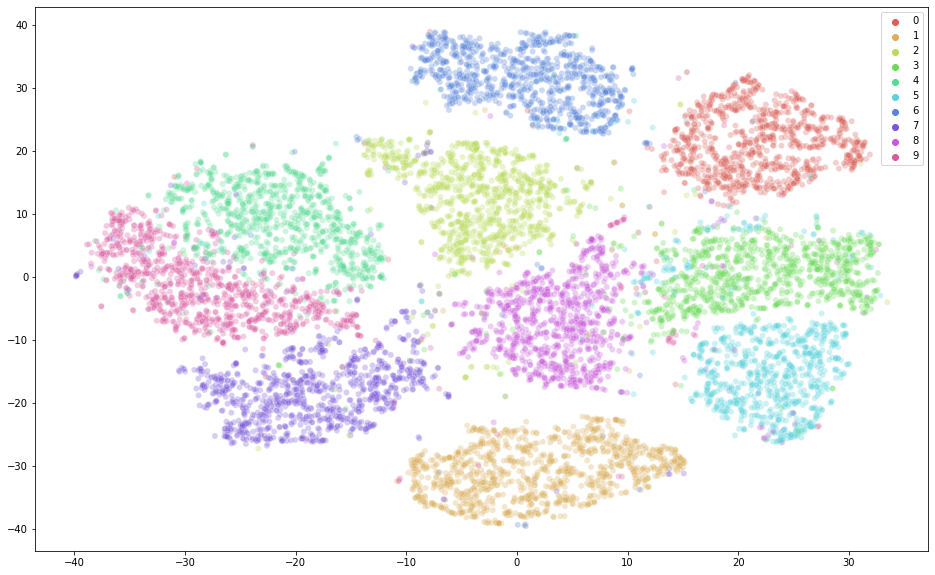

In [40]:
# Plots with different values of 𝛽
from IPython.display import Image
Image('beta0.png')

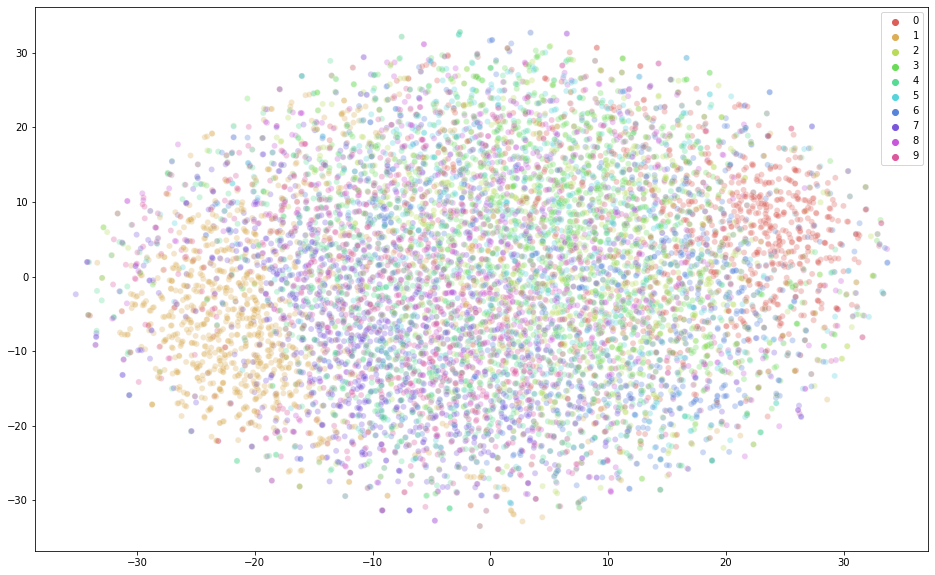

In [41]:
Image('beta10.png')

**YOUR ANSWER**

The loss function is composed of two elements: (1) the reconstruction error, which is a measure of how well the outputs match the inputs, and (2) the Kullback-Lieber divergence between the variational posterior and the prior on the latent variable.

For the above experiments, each pixel of the input data is seen as a independent Bernoulli observation. With this assumption in place, we can adopt the binary-cross entropy as reconstruction loss. For this reason, I have included the binarization of the image in the transforms. Moreover, 'sum' reduction has been performed in order to obtain the sum of the losses for all pixels in the mini-batch. Now the task can be seen as a classification of each pixel as 0 or 1. Therefore, the output data domain follows from the sigmoid layer and it is constrained to be between [0,1].

The role of the second term is to penalises the network if the distribution of the latent space deviates from the prior distribution. We can think of this term as a regularisation term. This constraint shapes the latent space in such a way that the decoder can act as a generative model. This term is computed in closed form assuming a multivariate normal distribution prior.

The two components of the loss function are combined in proportions that depend on beta. Specifically, before the two terms being added, the KL term is scaled by beta, making it more or less influential in the total loss. Beta has a direct control over the disentanglement in the latent space. Indeed, by decreasing beta, the disentanglement in the latent space increases and the reconstruction quality improves. By increasing beta, we put more weight on the KL term and as a result the disentanglement decreases and the reconstruction quality decreases. The best trade-off I have found experimentally is by adopting beta = 3.






<h2>Part 1.2 (9 points)</h2>

a. Plot your loss curves

b. Show reconstructions and samples

c. Discuss your results from parts (a) and (b)

## Part 1.2a: Loss Curves (3 Points)
Plot your loss curves (6 in total, 3 for the training set and 3 for the test set): total loss, reconstruction log likelihood loss, KL loss (x-axis: epochs, y-axis: loss). If you experimented with different values of $\beta$, you may wish to display multiple plots (worth 1 point).

Text(0, 0.5, 'Test Loss')

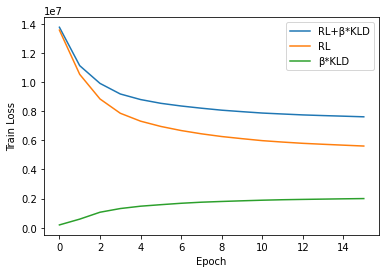

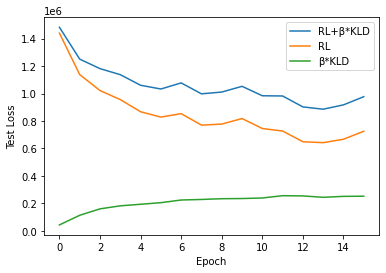

In [42]:
# *CODE FOR PART 1.2a IN THIS CELL*

legend = ["RL+β*KLD","RL","β*KLD"]

plt.plot(train_losses)
plt.legend(legend)
plt.xlabel("Epoch")
plt.ylabel("Train Loss")

plt.figure()

plt.plot(test_losses)
plt.legend(legend)
plt.xlabel("Epoch")
plt.ylabel("Test Loss")

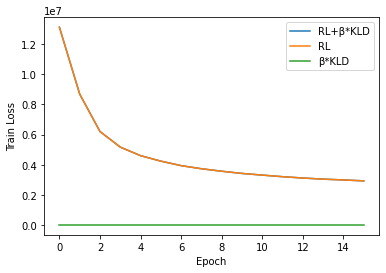

In [43]:
# Plots with different values of 𝛽
Image('beta0loss_train.png')

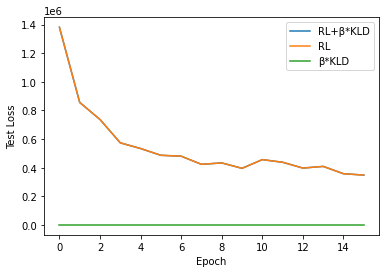

In [44]:
Image('beta0loss_test.png')

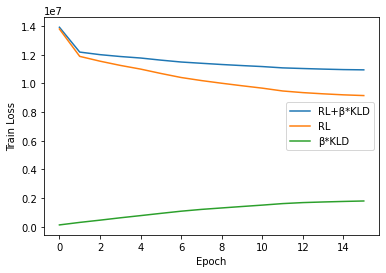

In [45]:
Image('beta10loss_train.png')

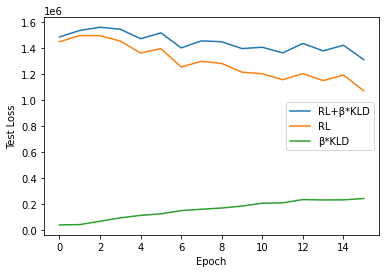

In [46]:
Image('beta10loss_test.png')

## Part 1.2b: Samples and Reconstructions (6 Points)
Visualize a subset of the images of the test set and their reconstructions **as well as** a few generated samples. Most of the code for this part is provided. You only need to call the forward pass of the model for the given inputs (might vary depending on your implementation).

Input images
--------------------------------------------------
Reconstructed images
--------------------------------------------------
Generated Images
--------------------------------------------------


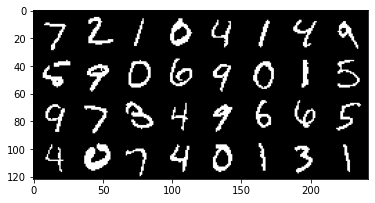

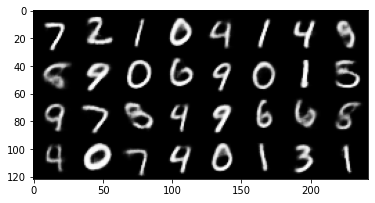

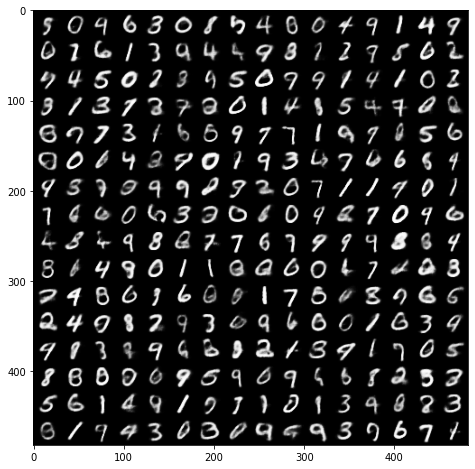

In [47]:
# *CODE FOR PART 1.2b IN THIS CELL*

# load the model
print('Input images')
print('-'*50)

sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[0:32, :, :, :]
# visualize the original images of the last batch of the test set
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
show(img)

print('Reconstructed images')
print('-'*50)
with torch.no_grad():
    # visualize the reconstructed images of the last batch of test set
    
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    recon_batch, mu, logvar = model.forward(fixed_input.to(device))
    #######################################################################
    #                       ** END OF YOUR CODE **
    ####################################################################### 
    
    recon_batch = recon_batch.cpu()
    recon_batch = make_grid(denorm(recon_batch), nrow=8, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure()
    show(recon_batch)

print('Generated Images')  
print('-'*50)
model.eval()
n_samples = 256
z = torch.randn(n_samples,latent_dim).to(device)
with torch.no_grad():
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    samples = model.decode(z)
    #######################################################################
    #                       ** END OF YOUR CODE **
    ####################################################################### 
    
    samples = samples.cpu()
    samples = make_grid(denorm(samples), nrow=16, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure(figsize = (8,8))
    show(samples)



### Discussion
Provide a brief analysis of your loss curves and reconstructions: 
* What do you observe in the behaviour of the log-likelihood loss and the KL loss (increasing/decreasing)?
* Can you intuitively explain if this behaviour is desirable? Have you observed posterior collapse during traing (i.e. when the KL is too small during the early stages of training)? 
    * If yes, how did you mitigate it? How did this phenomenon reflect on your output samples?
    * If no, why do you think that is?

**YOUR ANSWER**

From the above plots we can observe that the reconstruction loss decreases while the KL loss increases. This behaviour is desirable as it means that the contributions of both terms are well balanced. This equilibrium is what allows us to enforce a latent space that is useful for generating new samples. More specifically, we expect the reconstruction loss to decrease in order to produce outputs that better match the inputs, while we expect the KL divergence to increase because the reconstruction loss is greater in magnitude and the optimiser should favour its decrease at the cost of a small increase in KL divergence.

When posterior collapse occurs, we observe that the posterior collapses to the prior. Depending on the severity of this phenomenon, it makes the outputs more and more independent from the latent variable. In other words, the network will learn to ignore z as it doesn't hold any information concerning x. As a result, features from the input get lost. We can observe posterior collapse when we increase beta significantly (beta = 10). With such beta, we observe that the outputs roughly correspond to an intermediate point which satisfies all labels. Therefore, posterior collapse can be mitigated by selecting beta appropriately. 



---
<h2> Part 1.3 (11 points) <h2/>

Qualitative analysis of the learned representations

In this question you are asked to qualitatively assess the representations that your model has learned. In particular:

a. Dimensionality Reduction of learned embeddings

b. Interpolating in the latent space

## Part 1.3a: T-SNE on Embeddings (7 Points)
Extract the latent representations of the test set and visualize them using [T-SNE](https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding)  [(see implementation)](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html). 

We've provided a function to visualize a subset of the data, but you are encouraged to also produce a matplotlib plot (please use different colours for each digit class).

/usr/local/lib/python3.6/dist-packages/torchvision/datasets/mnist.py:63: UserWarning: test_data has been renamed data
  warnings.warn("test_data has been renamed data")
/usr/local/lib/python3.6/dist-packages/torchvision/datasets/mnist.py:53: UserWarning: test_labels has been renamed targets
  warnings.warn("test_labels has been renamed targets")


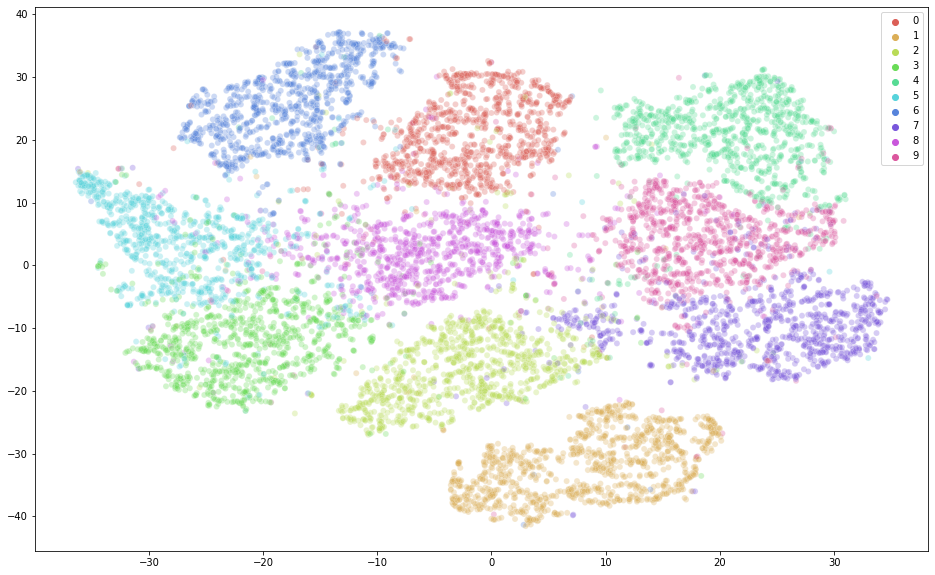

In [48]:
# *CODE FOR PART 1.3a IN THIS CELL
from sklearn.manifold import TSNE
import seaborn as sns

testing_data = ((loader_test.dataset.test_data).view(-1,1,28,28)).float()/255
labels = loader_test.dataset.test_labels

mu, logvar = model.encode(testing_data.to(device))
z = model.reparametrize(mu, logvar).cpu()

with torch.no_grad():
    tsne = TSNE(perplexity=40, n_components=2, n_iter=500, verbose=0,)
    results = tsne.fit_transform(z.detach().numpy())

    plt.figure(figsize=(16,10))

    sns.scatterplot(
        x=results[:,0], y=results[:,1],
        alpha=0.3,
        hue=labels,
        legend="full",
        palette=sns.color_palette("hls", 10)
    )

In [49]:
# Interactive Visualization - Code Provided
test_dataloader = DataLoader(test_dat, 10000, shuffle=False)
""" Inputs to the function are
        z_embedded - X, Y positions for every point in test_dataloader
        test_dataloader - dataloader with batchsize set to 10000
        num_points - number of points plotted (will slow down with >1k)
"""
z_embedded = results
plot_tsne(z_embedded, test_dataloader, num_points=1000, darkmode=False)


alt.HConcatChart(...)

### Discussion
What do you observe? Discuss the structure of the visualized representations. 
* What do you observe? What role do the KL loss term and $\beta$ have, if any, in what you observe (multiple matplotlib plots may be desirable here)?
    * Consider Outliers
    * Counsider Boundaries
    * Consider Clusters
* Is T-SNE reliable? What happens if you change the parameters (don't worry about being particularly thorough). [This link](https://distill.pub/2016/misread-tsne/) may be helpful.

**YOUR ANSWER**

From the representation above, we can observe how the various classes have been separated in clusters and, as desiderable, there is very limited space between the classes. This is the effect of combining the reconstruction loss and the KL divergence term: the former tries to separate the classes while the latter pushes them together under the gaussian prior. The role of beta is to balance the contributions of the two terms. The larger beta, the more important the KL divergence term becomes and, as an effect, clusters get closer to each other. On the other hand, with smaller betas, clusters get pushed more further apart from each other. Note that for extreme betas (beta = 10), the latent space loses this structure and labels are not separated anymore. We can observe how some outliers get placed away from their cluster. By inspecting them using the interactive visualization, we can see how their shapes are ambiguous and match the classes of the clusters they are close to.

As the objective of T-SNE is dimensionality reduction, we must keep in account that different low-dimensional representations could be produced for the same high-dimensional representations. As we can read in the suggested link, the choices of the parameters can largely affect the resulting representation. In particular, it is interesting to notice that the distances between clusters could be affected by the ratio between the number of samples and the perplexity. In other words, the resulting geometry depends heavily on the choice of some parameters. Therefore, while T-SNE can't be blindly trusted as tool to understand the latent space, it can certainly be useful if the parameters have been selected consistently to the data we are representing.


## Part 1.3b: Interpolating in $z$ (4 Points)
Perform a linear interpolation in the latent space of the autoencoder by choosing any two digits from the test set. What do you observe regarding the transition from on digit to the other?


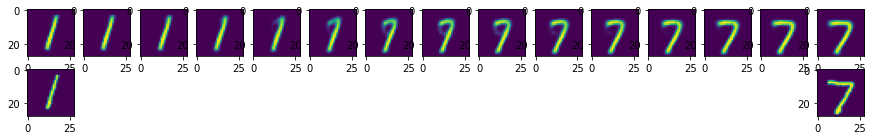

In [50]:
# CODE FOR PART 1.3b IN THIS CELL

def interpolate(number1, number2):

    steps = 15

    N = min(torch.sum(labels == number1), torch.sum(labels == number2))

    reference = testing_data[labels == number1][:N].to(device)
    objective = testing_data[labels == number2][:N].to(device)

    mu, logvar = model.encode(reference)
    z1 = model.reparametrize(mu, logvar).cpu()

    mu, logvar = model.encode(objective)
    z2 = model.reparametrize(mu, logvar).cpu() 

    embedding_values = [z2 * (i/steps) + z1 * (steps-i)/steps for i in range(steps)]
    recons = torch.stack([model.decode(embed.to(device)) for embed in embedding_values]).cpu()

    reference = reference.cpu()
    objective = objective.cpu()

    plt.figure(figsize=(steps, 2))

    for i, recon in enumerate(recons.detach().numpy()):
        plt.subplot(2, steps, i+1)
        plt.imshow(recon[0][0])

    plt.subplot(2, steps, steps+1)
    plt.imshow(reference[0][0])

    plt.subplot(2, steps, steps*2)
    plt.imshow(objective[0][0])

interpolate(1, 7)

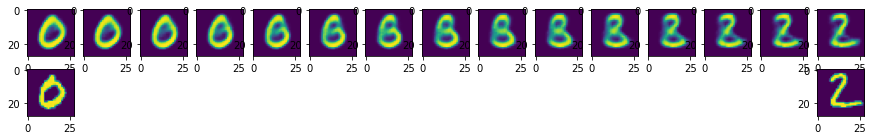

In [51]:
interpolate(0, 2)

### Discussion
What did you observe in the interpolation? Is this what you expected?
* Can you relate the interpolation to your T-SNE visualization

**YOUR ANSWER**

The interpolation between neighboring clusters in the T-SNE visualization procede smoothly and without unexpected shapes. This behaviour is to be expected as it reflects our understanding of the latent space. Furthermore, interpolation between classes that are clustered further apart in the visualization pass through the classes that must be crossed to linearly move from one cluster to another. An example of this is the interpolation between 0 and 2, where we observe an 8 appearing in the transition.

# Part 2 - Deep Convolutional GAN

In this task, your main objective is to train a DCGAN (https://arxiv.org/abs/1511.06434) on the CIFAR-10 dataset. You should experiment with different architectures, tricks for stability in training (such as using different activation functions, batch normalization, different values for the hyper-parameters, etc.). In the end, you should provide us with: 

- your best trained model (which we will be able to run), 
- some generations for the fixed latent vectors $\mathbf{z}\sim \mathcal{N}\left(\mathbf{0}, \mathbf{I}\right)$ we have provided you with (train for a number of epochs and make sure there is no mode collapse), 
- plots with the losses for the discriminator $D$ and the generator $G$ as the training progresses and explain whether your produced plots are theoretically sensible and why this is (or not) the case. 
- a discussion on whether you noticed any mode collapse, where this behaviour may be attributed to, and explanations of what you did in order to cope with mode collapse. 

## Part 2.1 (30 points)
**Your Task**: 

a. Implement the DCGAN architecture. 

b. Define a loss and implement the Training Loop

c. Visualize images sampled from your best model's generator ("Extension" Assessed on quality)

d. Discuss the experimentations which led to your final architecture. You can plot losses or generated results by other architectures that you tested to back your arguments (but this is not necessary to get full marks).


_Clarification: You should not be worrying too much about getting an "optimal" performance on your trained GAN. We want you to demonstrate to us that you experimented with different types of DCGAN variations, report what difficulties transpired throughout the training process, etc. In other words, if we see that you provided us with a running implementation, that you detail different experimentations that you did before providing us with your best one, and that you have grapsed the concepts, you can still get good marks. The attached model does not have to be perfect, and the extension marks for performance are only worth 10 points._

In [52]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.utils.data import sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
from torch.optim.lr_scheduler import StepLR, MultiStepLR
import torch.nn.functional as F
import matplotlib.pyplot as plt


def denorm(x, channels=None, w=None ,h=None, resize = False):
    x = 0.5 * (x + 1)
    x = x.clamp(0, 1)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists('/content/drive/MyDrive/icl_dl_cw2/CW_GAN'):
    os.makedirs('/content/drive/MyDrive/icl_dl_cw2/CW_GAN')

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

Using cuda


### Part 2.1a: Implement DCGAN (8 Points)
Fill in the missing parts in the cells below in order to complete the Generator and Discriminator classes. You will need to define:

- The hyperparameters
- The constructors
- `decode`
- `discriminator`

Recomendations for experimentation:
- use the architecture that you implemented for the Autoencoder of Part 1 (encoder as discriminator, decoder as generator).
- use the architecture desribed in the DCGAN paper (https://arxiv.org/abs/1511.06434).

Some general reccomendations:
- add several convolutional layers (3-4).
- accelerate training with batch normalization after every convolutional layer.
- use the appropriate activation functions. 
- Generator module: the upsampling can be done with various methods, such as nearest neighbor upsampling (`torch.nn.Upsample`) or transposed convolutions(`torch.nn.ConvTranspose2d`). 
- Discriminator module: Experiment with batch normalization (`torch.nn.BatchNorm2d`) and leaky relu (`torch.nn.LeakyReLu`) units after each convolutional layer.

Try to follow the common practices for CNNs (e.g small receptive fields, max pooling, RELU activations), in order to narrow down your possible choices.

<font color="red">**Your model should not have more than 25 Million Parameters**</font>

The number of epochs that will be needed in order to train the network will vary depending on your choices. As an advice, we recommend that while experimenting you should allow around 20 epochs and if the loss doesn't sufficiently drop, restart the training with a more powerful architecture. You don't need to train the network to an extreme if you don't have the time.

#### Data loading

In [53]:
batch_size = 128

transform_train = transforms.Compose([
     transforms.Resize(32),
     transforms.RandomHorizontalFlip(p = 0.5),
     transforms.CenterCrop(32),
     transforms.ToTensor(),
     transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
     transforms.Lambda(lambda x: np.clip(x + 0.05*torch.randn_like(x), -1,1)),                      
])

transform_test = transforms.Compose([
     transforms.ToTensor(),
     transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5),),                        
])

data_dir = './datasets'

cifar10_train = datasets.CIFAR10(data_dir, train=True, download=True, transform=transform_train)
cifar10_val = datasets.CIFAR10(data_dir, train=True, download=True, transform=transform_test)
cifar10_test = datasets.CIFAR10(data_dir, train=False, download=True, transform=transform_test)

loader_train = DataLoader(cifar10_train, batch_size=batch_size, sampler=sampler.SubsetRandomSampler(range(49000)))
loader_val = DataLoader(cifar10_val, batch_size=batch_size, sampler=sampler.SubsetRandomSampler(range(49000, 50000)))
loader_test = DataLoader(cifar10_test, batch_size=batch_size)

Files already downloaded and verified
Files already downloaded and verified
Files already downloaded and verified


We'll visualize a subset of the test set: 

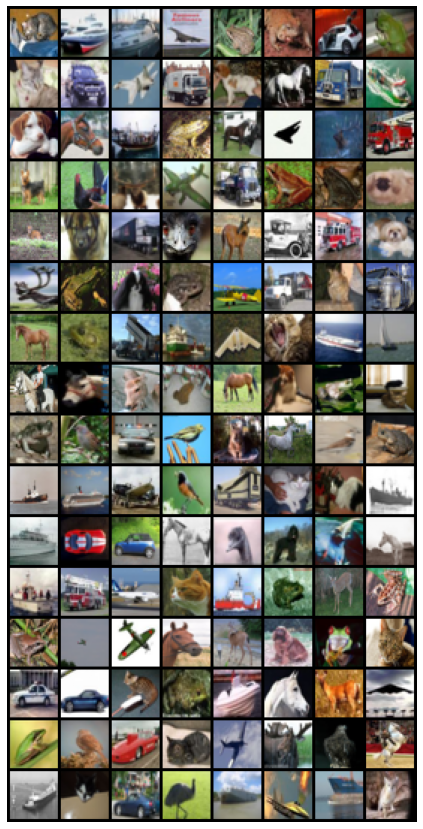

In [54]:
samples, _ = next(iter(loader_test))

samples = samples.cpu()
samples = make_grid(denorm(samples), nrow=8, padding=2, normalize=False,
                        range=None, scale_each=False, pad_value=0)
plt.figure(figsize = (15,15))
plt.axis('off')
show(samples)

#### Model Definition
Define hyperparameters and the model

In [55]:
# *CODE FOR PART 2.1 IN THIS CELL*

# Choose the number of epochs, the learning rate
# and the size of the Generator's input noise vetor.

num_epochs = 100
learning_rate_G = 0.0004
learning_rate_D = 0.0002
latent_vector_size = 32


In [56]:
# *CODE FOR PART 2.1 IN THIS CELL*
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################

        self.generator = nn.Sequential(
            nn.ConvTranspose2d(in_channels = latent_vector_size, out_channels = 192, kernel_size = 4, stride = 1, padding = 0, bias=False),
            nn.BatchNorm2d(192),
            nn.ReLU(True), 
            nn.ConvTranspose2d(in_channels = 192, out_channels = 96, kernel_size = 4, stride = 2, padding = 1, bias=False),
            nn.BatchNorm2d(96),
            nn.ReLU(True),
            nn.ConvTranspose2d(in_channels = 96, out_channels = 48, kernel_size = 4, stride = 2, padding = 1, bias=False),
            nn.BatchNorm2d(48),
            nn.ReLU(True),
            nn.ConvTranspose2d(in_channels = 48, out_channels = 3, kernel_size = 4, stride = 2, padding = 1, bias=False),
            nn.Tanh())

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 


    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################

        out = self.generator(x)
       
        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################
        return out


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################

        self.discriminator = nn.Sequential( 
            nn.Conv2d(in_channels = 3, out_channels = 64, kernel_size = 4, stride=2, padding=1, bias = False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, True),
            nn.Conv2d(in_channels = 64, out_channels = 128, kernel_size = 4, stride=2, padding=1, bias = False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, True),
            nn.Conv2d(in_channels = 128, out_channels = 256, kernel_size = 4, stride = 2, padding = 1, bias = False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, True),
            nn.Conv2d(in_channels = 256, out_channels = 1, kernel_size = 4, stride = 1, padding = 0, bias=False),
            nn.Sigmoid())
     
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################

        out = self.discriminator(x).view(-1, 1).squeeze(1)
     
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
        return out


<h2> Initialize Model and print number of parameters </h2>

You can use method `weights_init` to initialize the weights of the Generator and Discriminator networks. Otherwise, implement your own initialization, or do not use at all. You will not be penalized for not using initialization.

In [57]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__

    if classname.find('Conv') != -1:
        torch.nn.init.kaiming_normal_(m.weight)
        if m.bias is not None:
            torch.nn.init.zeros_(m.bias)
            
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [58]:
use_weights_init = True

model_G = Generator().to(device)
if use_weights_init:
    model_G.apply(weights_init)
params_G = sum(p.numel() for p in model_G.parameters() if p.requires_grad)
print("Total number of parameters in Generator is: {}".format(params_G))
print(model_G)
print('\n')

model_D = Discriminator().to(device)
if use_weights_init:
    model_D.apply(weights_init)
params_D = sum(p.numel() for p in model_D.parameters() if p.requires_grad)
print("Total number of parameters in Discriminator is: {}".format(params_D))
print(model_D)
print('\n')

print("Total number of parameters is: {}".format(params_G + params_D))

Total number of parameters in Generator is: 469920
Generator(
  (generator): Sequential(
    (0): ConvTranspose2d(32, 192, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(192, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(192, 96, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(96, 48, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(48, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Tanh()
  )
)


Total number of parameters in Discriminator is: 663424
Discriminator(
  (discriminator): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), paddin

### Part 2.1b: Training the Model (12 Points)

#### Defining a Loss

In [59]:
crit = nn.BCELoss(reduction='mean')

def loss_function(out, label):
    loss = crit(out, label)
    return loss

<h3>Choose and initialize optimizers</h3>

In [60]:
# setup optimizer
# You are free to add a scheduler or change the optimizer if you want. We chose one for you for simplicity.
optimizerD = torch.optim.Adam(model_D.parameters(), betas=(0.5, 0.999), lr=learning_rate_D)
optimizerG = torch.optim.Adam(model_G.parameters(), betas=(0.5, 0.999), lr=learning_rate_G)

schedulerD = torch.optim.lr_scheduler.StepLR(optimizerD, gamma = 0.95, step_size = 1)
schedulerG = torch.optim.lr_scheduler.StepLR(optimizerG, gamma = 0.95, step_size = 2)


<h3> Define fixed input vectors to monitor training and mode collapse. </h3>

In [61]:
fixed_noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)

real_label = 1
fake_label = 0

#### Training Loop

In [62]:
train_losses_generator = []
train_losses_discriminator = []

for epoch in range(num_epochs):
    for i, data in enumerate(loader_train, 0):
        train_loss_discriminator = 0
        train_loss_generator = 0
        
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################device
        # train with real
        model_D.zero_grad()
        current_batch = data[0].to(device)
        label = torch.full((current_batch.size(0),), real_label*0.9, device=device, dtype=torch.float) # smoothing
        out = model_D(current_batch)
        loss_discriminator_real = loss_function(out, label)
        loss_discriminator_real.backward()
        D_x = out.mean().item()


        # train with fake
        noise = torch.randn(current_batch.size(0), latent_vector_size, 1, 1, device=device)
        fake_out = model_G(noise)
        label.fill_(fake_label)
        out = model_D(fake_out.detach())
        loss_discriminator_fake = loss_function(out, label)
        loss_discriminator_fake.backward()
        D_G_z1 = out.mean().item()
        loss_discriminator = loss_discriminator_real + loss_discriminator_fake
        train_loss_discriminator += loss_discriminator.item()
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        model_G.zero_grad()
        label.fill_(real_label)
        output = model_D(fake_out)
        loss_generator = loss_function(output, label)
        loss_generator.backward()
        D_G_z2 = output.mean().item()
        train_loss_generator += loss_generator.item()
        optimizerG.step()
        
        if i % 100 == 0:
            print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(loader_train),
                    loss_discriminator.item(), loss_generator.item(), D_x, D_G_z1, D_G_z2))

    if epoch == 0:
        save_image(denorm(current_batch.cpu()).float(), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/real_samples.png')
    with torch.no_grad():
        fake = model_G(fixed_noise)
        save_image(denorm(fake.cpu()).float(), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/fake_samples_epoch_%03d.png' % epoch)
    train_losses_discriminator.append(train_loss_discriminator / len(loader_train))
    train_losses_generator.append(train_loss_generator / len(loader_train))
   
    
# save  models 
# if your discriminator/generator are conditional you'll want to change the inputs here
torch.jit.save(torch.jit.trace(model_G, (fixed_noise)), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/GAN_G_model.pth')
torch.jit.save(torch.jit.trace(model_D, (fake)), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/GAN_D_model.pth')



[0/100][0/383] Loss_D: 1.5167 Loss_G: 1.6521 D(x): 0.6098 D(G(z)): 0.5582 / 0.2266
[0/100][100/383] Loss_D: 0.4567 Loss_G: 4.4248 D(x): 0.7901 D(G(z)): 0.0501 / 0.0146
[0/100][200/383] Loss_D: 0.5489 Loss_G: 3.0779 D(x): 0.7846 D(G(z)): 0.1125 / 0.0512
[0/100][300/383] Loss_D: 0.5358 Loss_G: 3.0526 D(x): 0.8326 D(G(z)): 0.1417 / 0.0547
[1/100][0/383] Loss_D: 0.5312 Loss_G: 2.7855 D(x): 0.7599 D(G(z)): 0.0937 / 0.0741
[1/100][100/383] Loss_D: 0.6967 Loss_G: 2.6843 D(x): 0.7130 D(G(z)): 0.1741 / 0.0831
[1/100][200/383] Loss_D: 0.5894 Loss_G: 2.3282 D(x): 0.7866 D(G(z)): 0.1311 / 0.1275
[1/100][300/383] Loss_D: 0.5521 Loss_G: 3.0487 D(x): 0.7390 D(G(z)): 0.0888 / 0.0607
[2/100][0/383] Loss_D: 0.6236 Loss_G: 2.5683 D(x): 0.8259 D(G(z)): 0.1725 / 0.1097
[2/100][100/383] Loss_D: 0.6546 Loss_G: 2.8516 D(x): 0.8115 D(G(z)): 0.2116 / 0.0699
[2/100][200/383] Loss_D: 0.6716 Loss_G: 2.8967 D(x): 0.7043 D(G(z)): 0.1415 / 0.0721
[2/100][300/383] Loss_D: 0.7880 Loss_G: 2.2561 D(x): 0.7068 D(G(z)): 0.

## Part 2.1c: Results (10 Points)
This part is fairly open-ended, but not worth too much so do not go crazy. The table below shows examples of what are considered good samples. Level 3 and above will get you 10/10 points, level 2 will roughly get you 5/10 points and level 1 and below will get you 0/10 points.

<table><tr>
<td> 
  <p align="center" style="padding: 10px">
    <img alt="Forwarding" src="https://drive.google.com/uc?id=1wQ2f10-A1Vs7k0LMfBPPyYTsPlkBF9QE" width="%30">
    <br>
    <em style="color: grey">Level 1</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1wlDhX4hROET4s8Ndxn8nhj_0RLM2rnuG" width="%30">
    <br>
    <em style="color: grey">Level 2</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1w9VrgfJLCRaTPhwoFVYdYhtCeaQmFHGb" width="%30">
    <br>
    <em style="color: grey">Level 3</em>
  </p> 
</td>
</tr></table>

### Generator samples

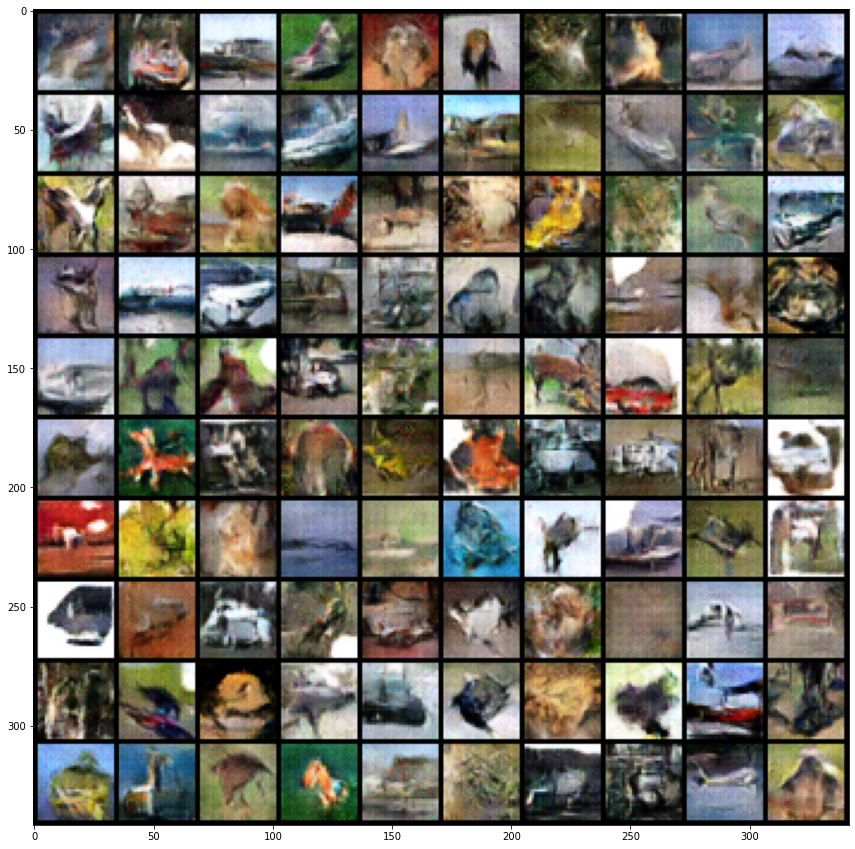

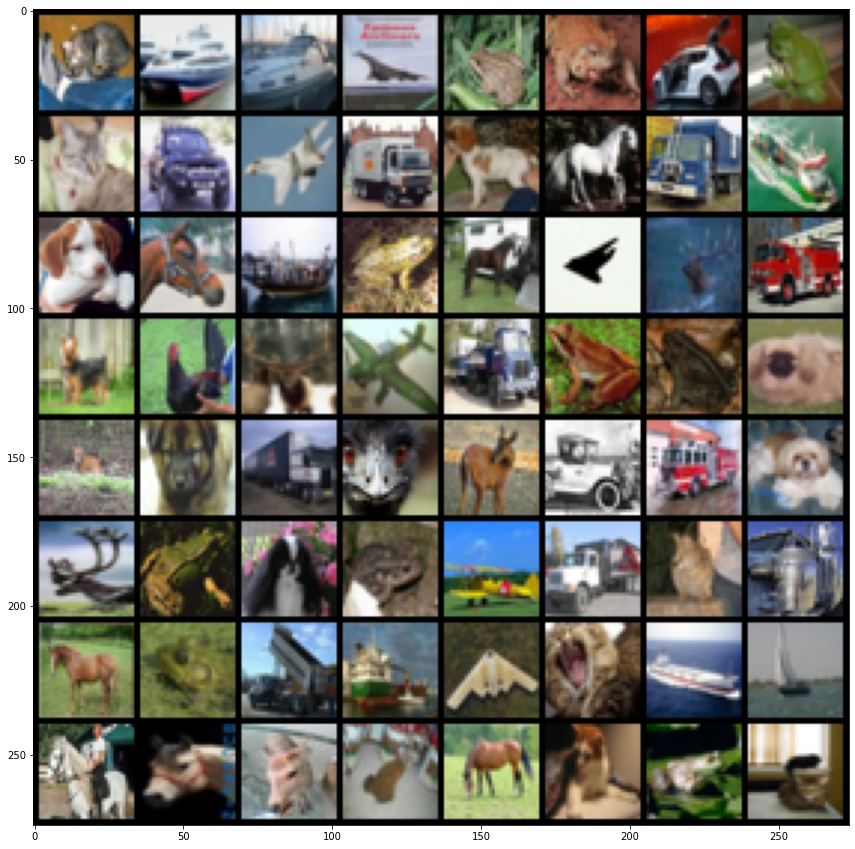

In [63]:
input_noise = torch.randn(100, latent_vector_size, 1, 1, device=device)

with torch.no_grad():
    # visualize the generated images
    generated = model_G(input_noise).cpu()
    generated = make_grid(denorm(generated)[:100], nrow=10, padding=2, normalize=False, 
                        range=None, scale_each=False, pad_value=0)
    plt.figure(figsize=(15,15))
    save_image(generated,'/content/drive/MyDrive/icl_dl_cw2/CW_GAN/Teaching30final.png')
    show(generated) # note these are now class conditional images columns rep classes 1-10

it = iter(loader_test)
sample_inputs, _ = next(it)
fixed_input = sample_inputs[0:64, :, :, :]
# visualize the original images of the last batch of the test set for comparison
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
show(img)

## Part 2.1d: Engineering Choices (10 Points)

Discuss the process you took to arrive at your final architecture. This should include:

* Which empirically useful methods did you utilize
* What didn't work, what worked and what mattered most
* Are there any tricks you came across in the literature etc. which you suspect would be helpful here

**Your Answer**

The proposed model is the result of various experiments that I performed in order to assess the individual contributions of each architectural choice and method.

In my first experiments, the generator was a CNN-based decoder composed of two layers of transpose convolutions with ReLU activations, followed by a max pooling layer and a tanh activation, while the discriminator had a similar architecture composed of two convolutional layers with Leaky ReLU activations, and in order to make the classification, a convolutional layer with kernel of size 1 followed by a softmax activation. Custom weight initialisation and small kernel sizes were adopted by following the common practices. This first architecture didn't produce good results: after six epochs it started producing some meaningless shapes but most of the images were covered in grey noise.

This observation suggested that the network was not deep enough. For that reason I have added two transpose convolutional layers in the generator and two convolutional layers in the discriminator. Also, I have added Batch Normalisation layers after each convolution in order to accelerate training as suggested in [1]. With this architecture, I observed a significant improvement in convergence and the quality of the images improved accordingly. The images produced started to consistently resemble those from the training dataset. Also, I noticed that some elementary features such as legs and wings started to appear earlier than the more complex once such as faces. This can be intuitively understood as we could interpret faces as a grouping of more elementary features (i.e. eyes, nose, and lips). After that, I tried removing the max pooling layer and I observed no significant change in performance. For this reason I removed it from the architecture. I also experimented replacing Batch Normalisations with Dropout layers but it worsened the quality of the generated images. For this reason I reintroduced the Batch Normalisation layers.

At this stage, I started experimenting with the learning rate and I introduced one scheduler for the generator and one for the discriminator. The idea is to allow the discriminator to settle faster than the generator. Also, I found that setting a lower learning rate for the discriminator improved convergence. Then I introduced some data augmentation techniques such as CenterCrop, RandomNoise, RandomFlip, and RandomHorizontalFlip. I experimented with these transforms separately in order to understand their individual contributions and then I kept only those that contributed positively to the quality of the generated images. I also experimented with the latent space dimension, and I found that a latent space of size 32 perfomed good, while lower values led to mode collapse. I also introduced label smoothing with positive results.

Another approach that could be beneficial is to adopt a conditional GAN [2]. This category of architectures introduces the class labels in the model. In this way, it is possible to conditionate the generator to produce images belonging to a specific class. There are many ways to encode and incorporate the class labels into the discriminator and generator models. A common approach is to introduce the labels in the generator by concatenating the label to the input noise, and in the discriminator by concatenating the label to the original output and making the so obtained tensor pass through a dense layer followed by a sigmoid activation. Indeed, this approach has been demonstrated to be effective on this dataset by Thekumparampil et al., 2018 [3].


[1] https://arxiv.org/pdf/1502.03167.pdf
[2] https://arxiv.org/abs/1411.1784
[3] https://arxiv.org/pdf/1811.03205.pdf


## Part 2.2: Understanding GAN Training (5 points)


### Loss Curves
**Your task:**


Plot the losses curves for the discriminator $D$ and the generator $G$ as the training progresses and explain whether the produced curves are theoretically sensible and why this is (or not) the case (x-axis: epochs, y-axis: loss).

Make sure that the version of the notebook you deliver includes these results.

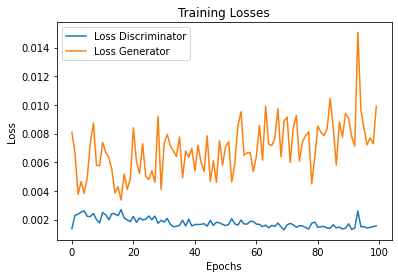

In [64]:
# ANSWER FOR PART 2.2 IN THIS CELL*
import matplotlib.pyplot as plt

plt.plot(list(range(0, np.array(train_losses_discriminator).shape[0])), np.array(train_losses_discriminator), label='Loss Discriminator')
plt.plot(list(range(0, np.array(train_losses_generator).shape[0])), np.array(train_losses_generator), label='Loss Generator')

plt.title('Training Losses')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

plt.show()

### Discussion

Do your loss curves look sensible? What would you expect to see and why?

**YOUR ANSWER**

The expected behaviour for the generator loss would be to decrease, meaning it is producing better images. As an effect, the discriminator loss should increase due to the fact that as the generator improves, it becomes more and more challenging for the discriminator to discern between fake and true images. This should theoretically lead to the equilibrium where the quality of the images generated is undistinguishable from the true images, making it impossible for the discriminator to correctly classify them.

Observing the train losses above, we notice that the two curves are approximatively parallel to each other, with the loss of the generator slightly increasing and the loss of the discriminator slightly decreasing. My intuition for this phenomenon is that the discriminator improves faster than the generator, making it better at classifying the images despite their quality be improving (at lower rate). Longer training could be key to find the optimum.

## Part 2.3: Understanding Mode Collapse (5 points) 
**Your task:** 

Based on the images created by your generator using the `fixed_noise` vector during training, provide a discussion on whether you noticed any mode collapse, what this behaviour may be attributed to, and explain what you did in order to cope with mode collapse.

### Discussion


**YOUR ANSWER**

Mode collapse is the phenomenon where the generator repetedly produces images with a small set of features that seems most plausible to the discriminator. From the generator point of view, this is extremely effective, as it is taking advantage of the weaknesses of the discriminator. However, we can intuitively understand that the discriminator will quickly learn to always label as false images with such features. As a result, the generator rotate through a small set of output types. An example of mode collapse can be observed in the figure proposed by the coursework as "Level 2". In this figure, we can see that some type of images are repeated several times.

By observing the images produced thourghout the training of my final architecture, I didn't notice any evidence of mode collapse at any stage: the images do not repeat and are different one from another. However, in my previous experiments, I found that smaller latent space dimensions (20) as well as smaller networks can lead to mode collapse. Intuitively, limiting those factors inhibit the generation power and incentivate producing the same modes over and over.

On a more general note, some approaches that could prevent mode collapse are the use of Unrolled GANs and the adoption of the Wasserstein loss [1]. 

[1] https://developers.google.com/machine-learning/gan/problems





# TA Test Cell
TAs will run this cell to ensure that your results are reproducible, and that your models have been defined suitably. 

<font color="blue"> <b> Please provide the input and output transformations required to make your VAE and GANs work. If your GAN generator requires more than just noise as input, also specify this below (there are two marked cells for you to inspect) </b></font>


In [65]:
# If you want to run these tests yourself, change directory:
# !cd /content/drive/MyDrive/icl_dl_cw2/

In [66]:
!pip install -q torch torchvision

In [67]:
# Do not remove anything here
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt 

show = lambda img: plt.imshow(np.transpose(img.cpu().numpy(), (1,2,0)))

device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")

# Do not change this cell!
torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

In [68]:
############# CHANGE THESE (COPY AND PASTE FROM YOUR OWN CODE) #############

vae_transform = transforms.Compose([
     transforms.ToTensor(),
     lambda x: x.round()
])

def vae_denorm(x):
    return x

#def gan_denorm(x):
#    return x

def gan_denorm(x, channels=None, w=None ,h=None, resize = False):
    x = 0.5 * (x + 1)
    x = x.clamp(0, 1)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

gan_latent_size = 32

# If your generator requires something other than noise as input, please specify
# two cells down from here

In [69]:
# Load VAE Dataset
test_dat = datasets.MNIST("./data/", train=False, transform=vae_transform, 
                          download=True)
vae_loader_test = DataLoader(test_dat, batch_size=32, shuffle=False)

In [70]:
############# MODIFY IF NEEDED #############
vae_input, _ = next(iter(vae_loader_test))

# If your generator is conditional, then please modify this input suitably
input_noise = torch.randn(100, gan_latent_size, 1, 1, device=device)
gan_input = [input_noise] # In case you want to provide a tuple, we wrap ours

Used Convs


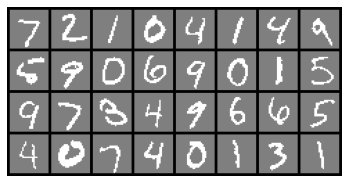

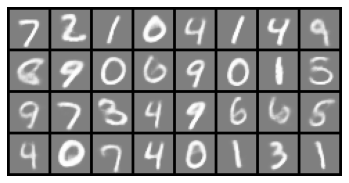

In [71]:
# VAE Tests
# TAs will change these paths as you will have provided the model files manually
"""To TAs, you should have been creating a folder with the student uid
   And the .ipynb + models in the root. Then that path is './VAE_model.pth' etc.
"""
vae = model_G = torch.jit.load('./drive/MyDrive/icl_dl_cw2/CW_VAE/VAE_model.pth')
vae.eval()

# Check if VAE is convolutional

for module in vae.children():
    for layer in module.children():
        if "Conv2d" in layer.original_name:
            print("Used Convs")
            break

vae_in = make_grid(denorm(vae_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_in)

vae_test = vae(vae_input.to(device))[0].detach()
vae_reco = make_grid(denorm(vae_test), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_reco)

Number of Parameters is 1133344 which is ok


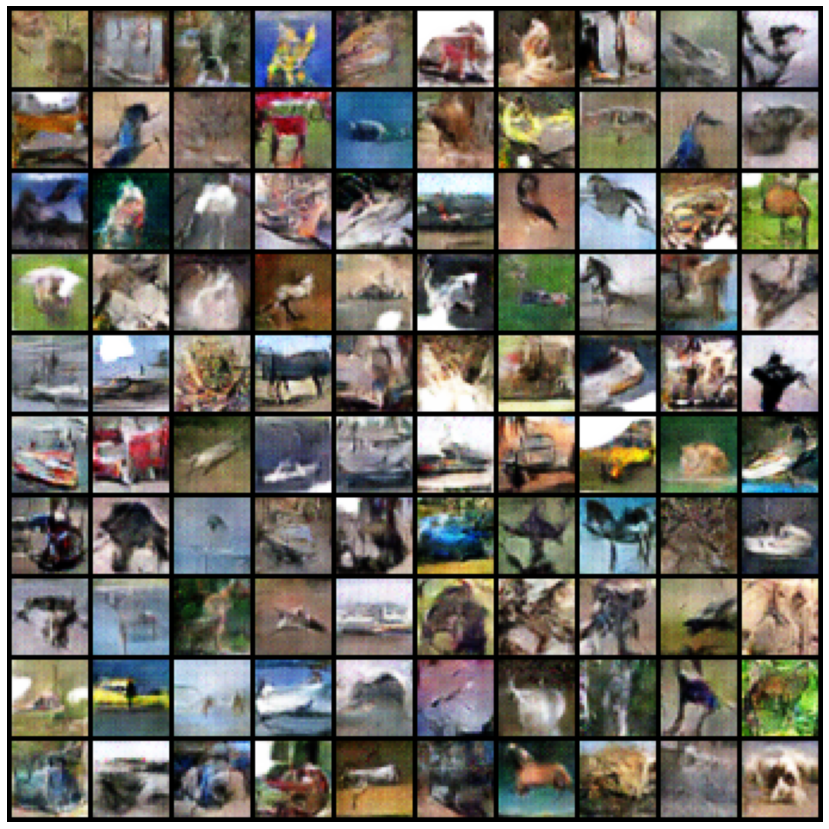

In [72]:
# GAN Tests
model_G = torch.jit.load('./drive/MyDrive/icl_dl_cw2/CW_GAN/GAN_G_model.pth')
model_D = torch.jit.load('./drive/MyDrive/icl_dl_cw2/CW_GAN/GAN_D_model.pth')
[model.eval() for model in (model_G, model_D)]  

# Check that GAN doesn't have too many parameters
num_param = sum(p.numel() for p in [*model_G.parameters(),*model_D.parameters()])

print(f"Number of Parameters is {num_param} which is", "ok" if num_param<25E+6 else "not ok")

# visualize the generated images
generated = model_G(*gan_input).cpu()
generated = make_grid(gan_denorm(generated)[:100].detach(), nrow=10, padding=2, normalize=False, 
                    range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
plt.axis('off')
show(generated)